# Essais clustering

In [85]:
%load_ext lab_black

The lab_black extension is already loaded. To reload it, use:
  %reload_ext lab_black


In [86]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

## Import fichier csv dans dataframe pandas

In [87]:
# Importer le fichier CSV en DataFrame
customer_grouped = pd.read_csv("customer_grouped.csv")

## Fixer la random seed

In [88]:
import numpy as np
import random
import os

# Fixer la graine aléatoire pour numpy
np.random.seed(42)

# Fixer la graine aléatoire pour random
random.seed(42)

# Fixer la graine aléatoire pour scikit-learn
os.environ["PYTHONHASHSEED"] = "42"

## 1er Clustering - 1er k-means

### Méthode du coude

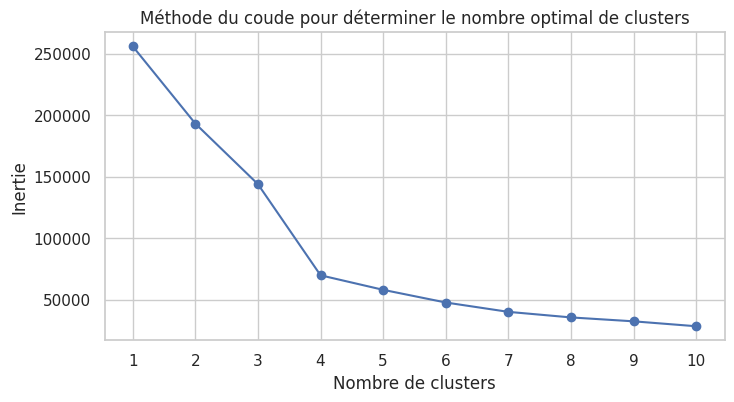

In [89]:
# Normalisation des caractéristiques
scaler = StandardScaler()
features_scaled = scaler.fit_transform(
    customer_grouped[["frequence", "montant", "recence"]]
)

# Calcul de la somme des carrés des distances pour différents nombres de clusters
inertia = []
for k in range(1, 11):  # tester k de 1 à 10
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 4))
plt.plot(range(1, 11), inertia, marker="o")
plt.title("Méthode du coude pour déterminer le nombre optimal de clusters")
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie")
plt.xticks(range(1, 11))
plt.grid(True)

### Clustering k-means

In [90]:
# Préparation des caractéristiques (features) pour le clustering
features = customer_grouped[["frequence", "montant", "recence"]]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Définir le modèle K-means avec 4 clusters
kmeans = KMeans(n_clusters=4, random_state=42)

# Appliquer le modèle K-means aux données normalisées
kmeans.fit(features_scaled)

# Ajouter les labels des clusters au DataFrame original
customer_grouped["Cluster"] = kmeans.labels_

# Afficher les premières lignes pour voir les résultats
print(customer_grouped.head())

# Centroïdes
print("Centres des clusters:", kmeans.cluster_centers_)

                 customer_unique_id  frequence  montant  moyenne_review_score  \
0  0000366f3b9a7992bf8c76cfdf3221e2          1   141.90                   5.0   
1  0000b849f77a49e4a4ce2b2a4ca5be3f          1    27.19                   4.0   
2  0000f46a3911fa3c0805444483337064          1    86.22                   3.0   
3  0000f6ccb0745a6a4b88665a16c9f078          1    43.62                   4.0   
4  0004aac84e0df4da2b147fca70cf8255          1   196.89                   5.0   

      recence  Cluster  
0  160.273507        0  
1  163.263090        0  
2  585.850868        2  
3  369.875428        2  
4  336.905972        1  
Centres des clusters: [[-0.15096631 -0.46826973 -0.72218029]
 [-0.15096631  1.48788947 -0.12956258]
 [-0.15096631 -0.39525797  1.05322013]
 [ 6.27681031  1.02833375 -0.10444888]]


### Score de silhouette

In [91]:
# Calcul du score de silhouette
silhouette_avg = silhouette_score(features_scaled, kmeans.labels_)

print(f"Le score de silhouette moyen pour 4 clusters est de : {silhouette_avg:.2f}")

Le score de silhouette moyen pour 4 clusters est de : 0.42


In [92]:
cluster_counts = customer_grouped["Cluster"].value_counts()

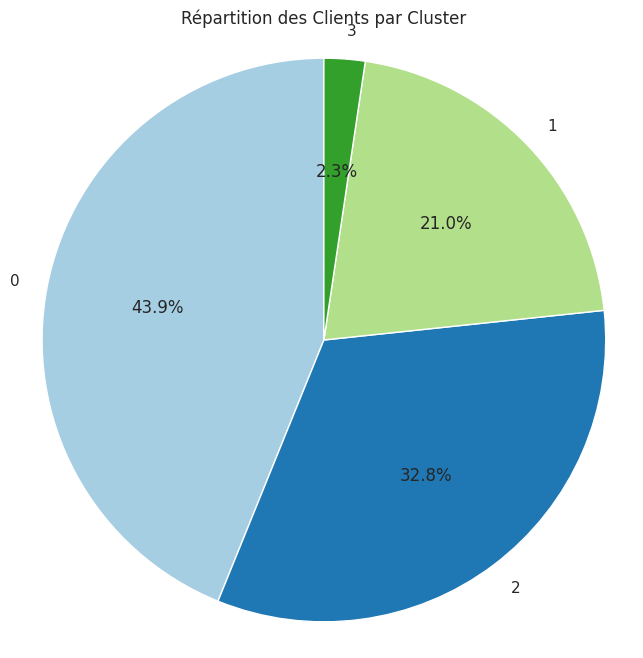

In [93]:
# Créer un diagramme en camembert
plt.figure(figsize=(8, 8))  # Taille du graphique
plt.pie(
    cluster_counts,
    labels=cluster_counts.index,
    autopct="%1.1f%%",
    startangle=90,
    colors=plt.cm.Paired(range(len(cluster_counts))),
)
plt.title("Répartition des Clients par Cluster")
plt.axis("equal")  # Assure que le calendos est dessiné comme un cercle.

# Afficher le graphique
plt.show()

### Illustration

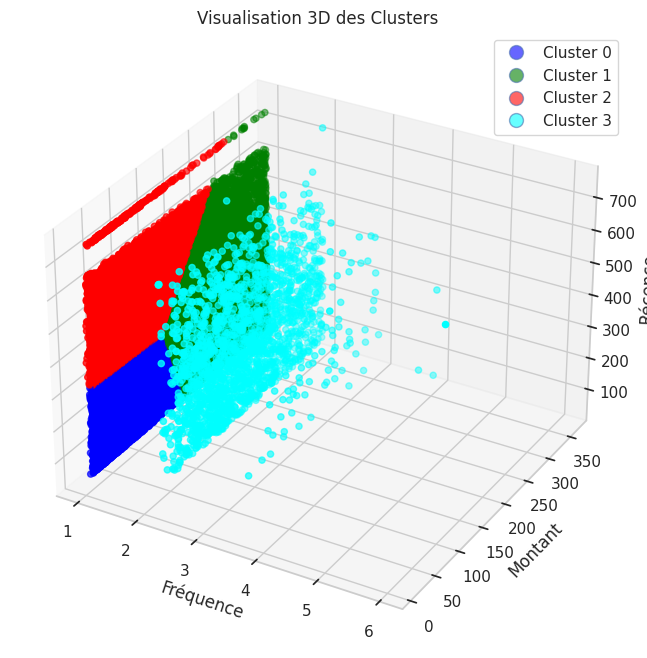

In [94]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Configuration de la figure
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection="3d")

# Extraire les caractéristiques et les labels de cluster
x = customer_grouped["frequence"]
y = customer_grouped["montant"]
z = customer_grouped["recence"]
clusters = customer_grouped["Cluster"]

# Couleurs pour les différents clusters, ajuster selon le nombre de clusters
colors = [
    "blue",
    "green",
    "red",
    "cyan",
    "magenta",
    "yellow",
]

# Tracer tous les points en une seule fois
scatter = ax.scatter(x, y, z, c=[colors[i] for i in clusters], marker="o")

# Ajouter des étiquettes et des titres
ax.set_xlabel("Fréquence")
ax.set_ylabel("Montant")
ax.set_zlabel("Récence")
plt.title("Visualisation 3D des Clusters")

# Légende pour les clusters
legend = [
    plt.Line2D(
        [0],
        [0],
        linestyle="none",
        marker="o",
        alpha=0.6,
        markersize=10,
        markerfacecolor=color,
    )
    for color in colors[: len(set(clusters))]
]
ax.legend(legend, ["Cluster {}".format(i) for i in range(len(set(clusters)))])

# Afficher le graphique
plt.show()

In [95]:
import plotly.graph_objects as go

# Création de la figure
fig = go.Figure()

# Ajout des points de données au graphique
fig.add_trace(
    go.Scatter3d(
        x=customer_grouped["frequence"],
        y=customer_grouped["montant"],
        z=customer_grouped["recence"],
        mode="markers",
        marker=dict(
            size=5,
            color=customer_grouped[
                "Cluster"
            ],  # Chaque cluster a une couleur différente
            colorscale="Viridis",  # Palette de couleurs
            opacity=0.8,
        ),
    )
)

# Mise en forme du graphique
fig.update_layout(
    title="Visualisation 3D des Clusters avec Plotly",
    scene=dict(xaxis_title="Fréquence", yaxis_title="Montant", zaxis_title="Récence"),
    margin=dict(l=0, r=0, b=0, t=0),  # Marges réduites pour un affichage plus large
)

# Afficher le graphique
fig.show()

### Graphe deux à deux

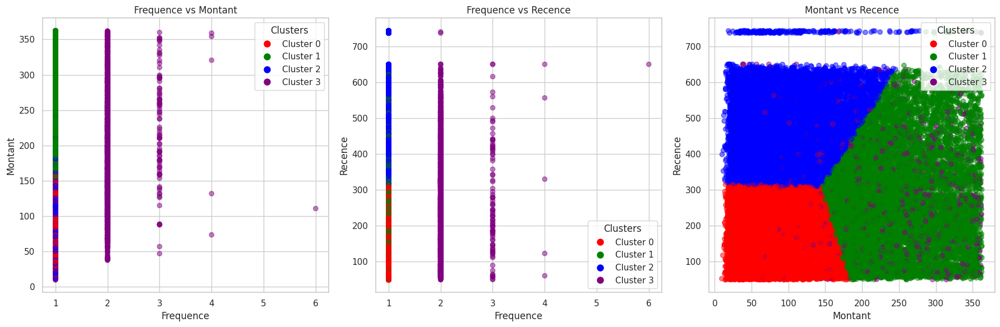

In [96]:
# Définir les couleurs pour chaque cluster
colors = {0: "red", 1: "green", 2: "blue", 3: "purple"}

# Mappage des couleurs aux clusters
cluster_colors = [colors[label] for label in customer_grouped["Cluster"]]

# Création de la figure et des axes
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Graphique pour Frequence vs Montant
scatter1 = ax[0].scatter(
    customer_grouped["frequence"],
    customer_grouped["montant"],
    c=cluster_colors,
    alpha=0.5,
)
ax[0].set_title("Frequence vs Montant")
ax[0].set_xlabel("Frequence")
ax[0].set_ylabel("Montant")

# Graphique pour Frequence vs Recence
scatter2 = ax[1].scatter(
    customer_grouped["frequence"],
    customer_grouped["recence"],
    c=cluster_colors,
    alpha=0.5,
)
ax[1].set_title("Frequence vs Recence")
ax[1].set_xlabel("Frequence")
ax[1].set_ylabel("Recence")

# Graphique pour Montant vs Recence
scatter3 = ax[2].scatter(
    customer_grouped["montant"],
    customer_grouped["recence"],
    c=cluster_colors,
    alpha=0.5,
)
ax[2].set_title("Montant vs Recence")
ax[2].set_xlabel("Montant")
ax[2].set_ylabel("Recence")

# Créer une légende pour les clusters
from matplotlib.lines import Line2D

legend_elements = [
    Line2D(
        [0],
        [0],
        marker="o",
        color="w",
        label=f"Cluster {i}",
        markerfacecolor=mcolor,
        markersize=10,
    )
    for i, mcolor in colors.items()
]
for axx in ax:
    axx.legend(handles=legend_elements, title="Clusters")

# Afficher les graphiques
plt.tight_layout()
plt.show()

### PCA & graphique

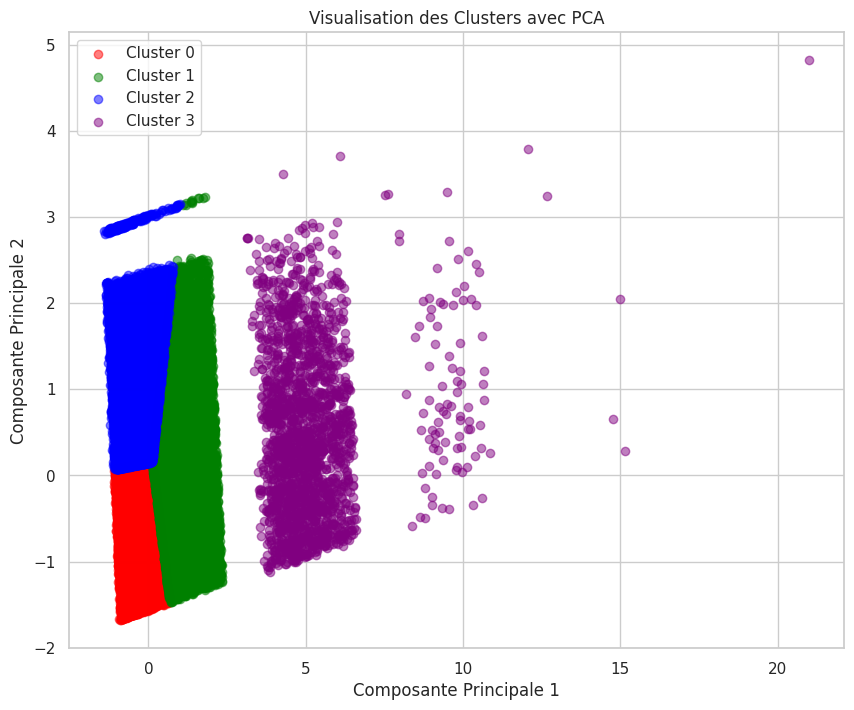

In [97]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np

# preparation données

features = customer_grouped[["frequence", "montant", "recence"]]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# application PCA

pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)


# création du graphique

plt.figure(figsize=(10, 8))
colors = ["red", "green", "blue", "purple"]

for i in range(4):
    # Sélectionner seulement les données du ième cluster
    pc1 = features_pca[customer_grouped["Cluster"] == i, 0]
    pc2 = features_pca[customer_grouped["Cluster"] == i, 1]
    plt.scatter(pc1, pc2, c=colors[i], label=f"Cluster {i}", alpha=0.5)

plt.title("Visualisation des Clusters avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend()
plt.grid(True)
plt.show()

<Figure size 800x800 with 0 Axes>

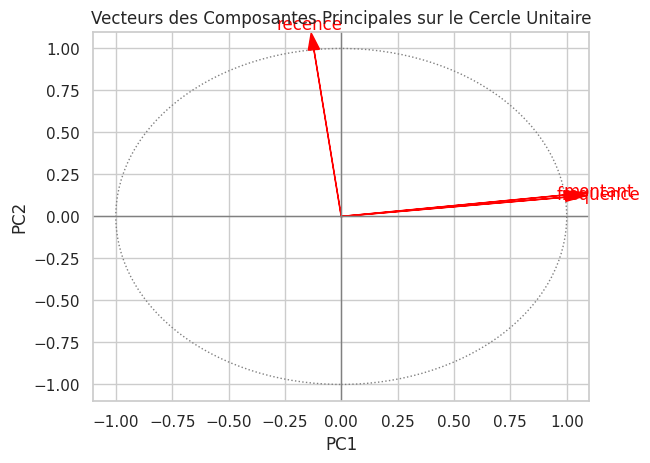

In [98]:
# Création d'un graphique
plt.figure(figsize=(8, 8))
circle = plt.Circle((0, 0), 1, fill=False, color="grey", linestyle="dotted")

# Ajouter le cercle au plot
fig, ax = plt.subplots()
ax.add_artist(circle)

# Ajout des vecteurs des composantes principales
for i, (component, var) in enumerate(zip(pca.components_.T, features.columns)):
    length = np.sqrt(
        component[0] ** 2 + component[1] ** 2
    )  # Longueur du vecteur pour normalisation
    ax.arrow(
        0,
        0,
        component[0] / length,
        component[1] / length,
        head_width=0.05,
        head_length=0.1,
        fc="red",
        ec="red",
    )
    plt.text(
        component[0] / length * 1.15,
        component[1] / length * 1.15,
        var,
        color="red",
        ha="center",
        va="center",
    )

# Mise en forme du graphique
ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_title("Vecteurs des Composantes Principales sur le Cercle Unitaire")
ax.axhline(0, color="grey", lw=1)
ax.axvline(0, color="grey", lw=1)
ax.grid(True)

# Afficher le graphique
plt.show()

<Figure size 800x800 with 0 Axes>

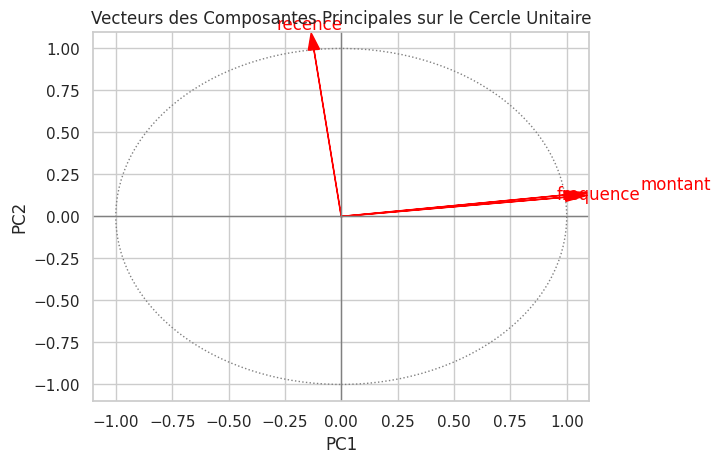

In [99]:
import numpy as np
import matplotlib.pyplot as plt


# Création d'un graphique
plt.figure(figsize=(8, 8))
circle = plt.Circle((0, 0), 1, fill=False, color="grey", linestyle="dotted")

# Ajouter le cercle au plot
fig, ax = plt.subplots()
ax.add_artist(circle)

# Stocker les positions des étiquettes pour éviter les chevauchements
label_positions = []

# Ajout des vecteurs des composantes principales
for i, (component, var) in enumerate(zip(pca.components_.T, features.columns)):
    length = np.sqrt(
        component[0] ** 2 + component[1] ** 2
    )  # Longueur du vecteur pour normalisation
    vector_end = component / length
    label_position = vector_end * 1.15

    # Si la position est déjà utilisée, on ajoute un décalage
    while any(np.allclose(label_position, pos, atol=0.1) for pos in label_positions):
        label_position *= 1.3  # Augmenter légèrement la position

    label_positions.append(label_position)

    ax.arrow(
        0,
        0,
        vector_end[0],
        vector_end[1],
        head_width=0.05,
        head_length=0.1,
        fc="red",
        ec="red",
    )
    plt.text(
        label_position[0], label_position[1], var, color="red", ha="center", va="center"
    )

# Mise en forme du graphique
ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_title("Vecteurs des Composantes Principales sur le Cercle Unitaire")
ax.axhline(0, color="grey", lw=1)
ax.axvline(0, color="grey", lw=1)
ax.grid(True)

# Afficher le graphique
plt.show()

## 2nd Clustering avec note moyenne (k-means)

### Méthode du coude

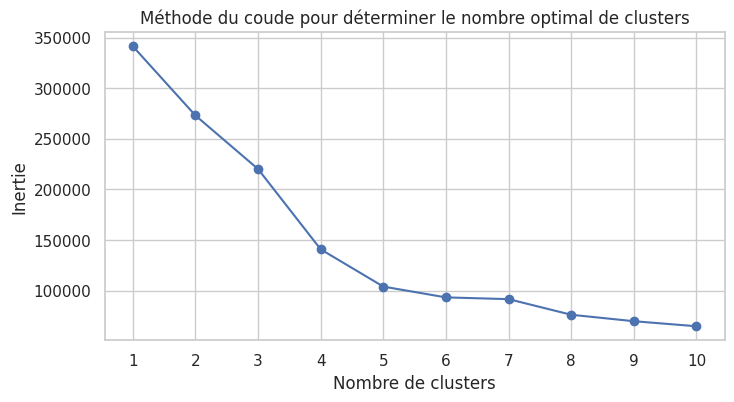

In [100]:
# Normalisation des caractéristiques
scaler = StandardScaler()
features_scaled = scaler.fit_transform(
    customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
)

# Calcul de la somme des carrés des distances pour différents nombres de clusters
inertia = []
for k in range(1, 11):  # tester k de 1 à 10
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(features_scaled)
    inertia.append(kmeans.inertia_)

# Tracer la courbe du coude
plt.figure(figsize=(8, 4))
plt.plot(range(1, 11), inertia, marker="o")
plt.title("Méthode du coude pour déterminer le nombre optimal de clusters")
plt.xlabel("Nombre de clusters")
plt.ylabel("Inertie")
plt.xticks(range(1, 11))
plt.grid(True)

### Clustering k-means

In [101]:
##5 clusters

# Préparation des caractéristiques (features) pour le clustering
features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Définir le modèle K-means avec 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)

# Appliquer le modèle K-means aux données normalisées
kmeans.fit(features_scaled)

# Ajouter les labels des clusters au DataFrame original
customer_grouped["Cluster"] = kmeans.labels_

# Afficher les premières lignes pour voir les résultats
print(customer_grouped.head())

# Centroïdes
print("Centres des clusters:", kmeans.cluster_centers_)

                 customer_unique_id  frequence  montant  moyenne_review_score  \
0  0000366f3b9a7992bf8c76cfdf3221e2          1   141.90                   5.0   
1  0000b849f77a49e4a4ce2b2a4ca5be3f          1    27.19                   4.0   
2  0000f46a3911fa3c0805444483337064          1    86.22                   3.0   
3  0000f6ccb0745a6a4b88665a16c9f078          1    43.62                   4.0   
4  0004aac84e0df4da2b147fca70cf8255          1   196.89                   5.0   

      recence  Cluster  
0  160.273507        0  
1  163.263090        0  
2  585.850868        3  
3  369.875428        3  
4  336.905972        1  
Centres des clusters: [[-0.15096631 -0.48948245 -0.73274809  0.38129165]
 [-0.15096631  1.51299729 -0.14237683  0.33087023]
 [-0.15096631  0.04773538 -0.01333209 -2.0772249 ]
 [-0.15096631 -0.39222011  1.10058593  0.3485669 ]
 [ 6.27681031  1.02833375 -0.10444888  0.05041648]]


### Score de silhouette

In [102]:
# Calcul du score de silhouette
silhouette_avg = silhouette_score(features_scaled, kmeans.labels_)

print(f"Le score de silhouette moyen pour 5 clusters est de : {silhouette_avg:.2f}")

Le score de silhouette moyen pour 5 clusters est de : 0.36


### PCA & graphique

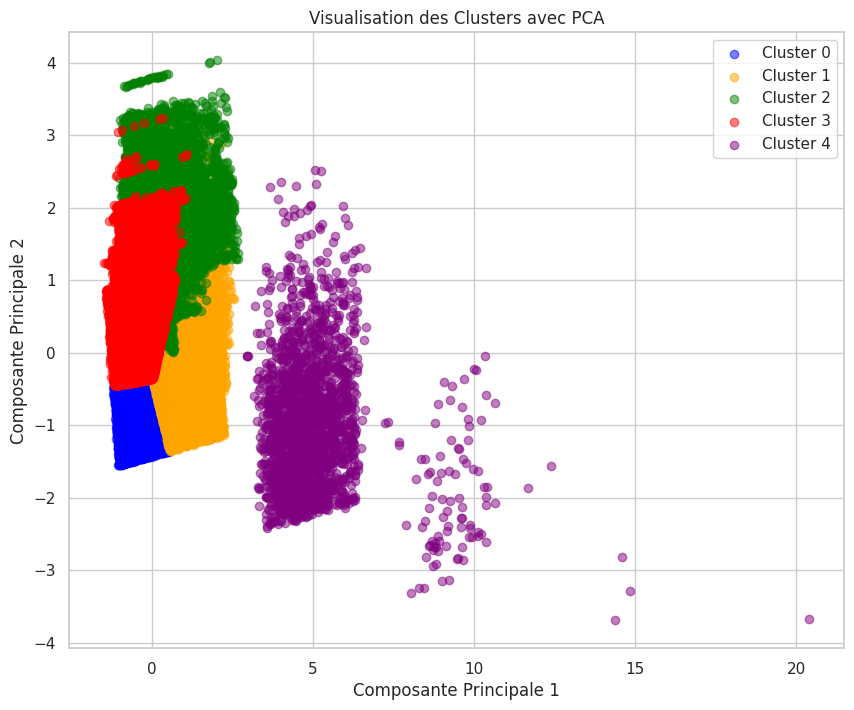

In [103]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np

# preparation données

features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# application PCA

pca = PCA(n_components=2)
features_pca = pca.fit_transform(features_scaled)


# création du graphique

plt.figure(figsize=(10, 8))
colors = ["blue", "orange", "green", "red", "purple"]

for i in range(5):
    # Sélectionner seulement les données du ième cluster
    pc1 = features_pca[customer_grouped["Cluster"] == i, 0]
    pc2 = features_pca[customer_grouped["Cluster"] == i, 1]
    plt.scatter(pc1, pc2, c=colors[i], label=f"Cluster {i}", alpha=0.5)

plt.title("Visualisation des Clusters avec PCA")
plt.xlabel("Composante Principale 1")
plt.ylabel("Composante Principale 2")
plt.legend()
plt.grid(True)
plt.show()

<Figure size 800x800 with 0 Axes>

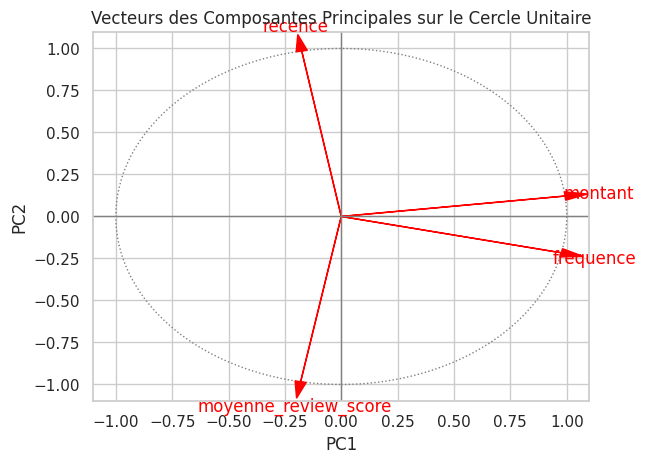

In [104]:
# Création d'un graphique
plt.figure(figsize=(8, 8))
circle = plt.Circle((0, 0), 1, fill=False, color="grey", linestyle="dotted")

# Ajouter le cercle au plot
fig, ax = plt.subplots()
ax.add_artist(circle)

# Ajout des vecteurs des composantes principales
for i, (component, var) in enumerate(zip(pca.components_.T, features.columns)):
    length = np.sqrt(
        component[0] ** 2 + component[1] ** 2
    )  # Longueur du vecteur pour normalisation
    ax.arrow(
        0,
        0,
        component[0] / length,
        component[1] / length,
        head_width=0.05,
        head_length=0.1,
        fc="red",
        ec="red",
    )
    plt.text(
        component[0] / length * 1.15,
        component[1] / length * 1.15,
        var,
        color="red",
        ha="center",
        va="center",
    )

# Mise en forme du graphique
ax.set_xlim(-1.1, 1.1)
ax.set_ylim(-1.1, 1.1)
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_title("Vecteurs des Composantes Principales sur le Cercle Unitaire")
ax.axhline(0, color="grey", lw=1)
ax.axvline(0, color="grey", lw=1)
ax.grid(True)

# Afficher le graphique
plt.show()

### Graphe 2à2

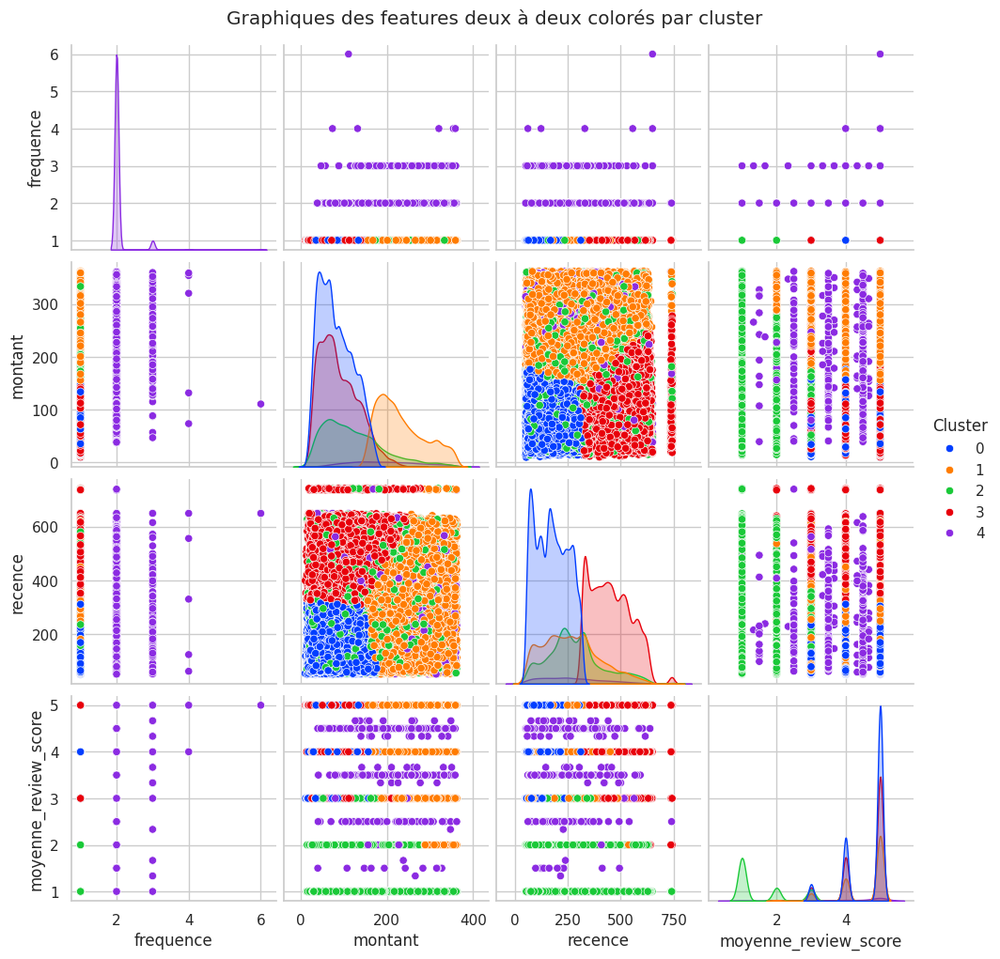

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assurez-vous que les clusters sont bien ajoutés au DataFrame original
customer_grouped["Cluster"] = kmeans.labels_

# Utiliser pairplot pour tracer les graphiques des features deux à deux
sns.pairplot(
    customer_grouped,
    vars=["frequence", "montant", "recence", "moyenne_review_score"],
    hue="Cluster",
    palette="bright",
    diag_kind="kde",
)

# Afficher le graphique
plt.suptitle(
    "Graphiques des features deux à deux colorés par cluster", y=1.02
)  # Ajouter un titre global
plt.show()

## DBSCAN avec ReviewScore

### KNN Distance Plot pour estimation epsilon

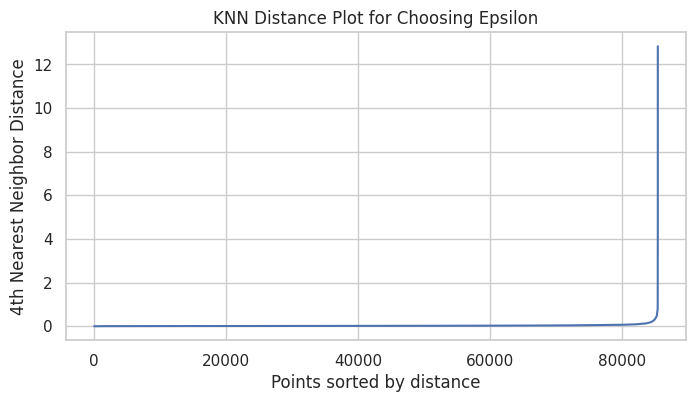

In [106]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
import matplotlib.pyplot as plt

# Normalisation des caractéristiques
scaler = StandardScaler()
features_scaled = scaler.fit_transform(
    customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
)

# Utiliser NearestNeighbors pour trouver les distances du k-ième plus proche voisin
nearest_neighbors = NearestNeighbors(n_neighbors=100)  # Vous pouvez ajuster k ici
nearest_neighbors.fit(features_scaled)
distances, indices = nearest_neighbors.kneighbors(features_scaled)

# Trier et tracer les distances du k-ième plus proche voisin
sorted_distances = np.sort(
    distances[:, 3], axis=0
)  # k=4, donc indice 3 pour le 4e plus proche
plt.figure(figsize=(8, 4))
plt.plot(sorted_distances)
plt.title("KNN Distance Plot for Choosing Epsilon")
plt.xlabel("Points sorted by distance")
plt.ylabel("4th Nearest Neighbor Distance")
plt.grid(True)
plt.show()

### clustering

Labels des clusters: [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22
 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44]
Le score de silhouette pour DBSCAN est : -0.04190197964222131


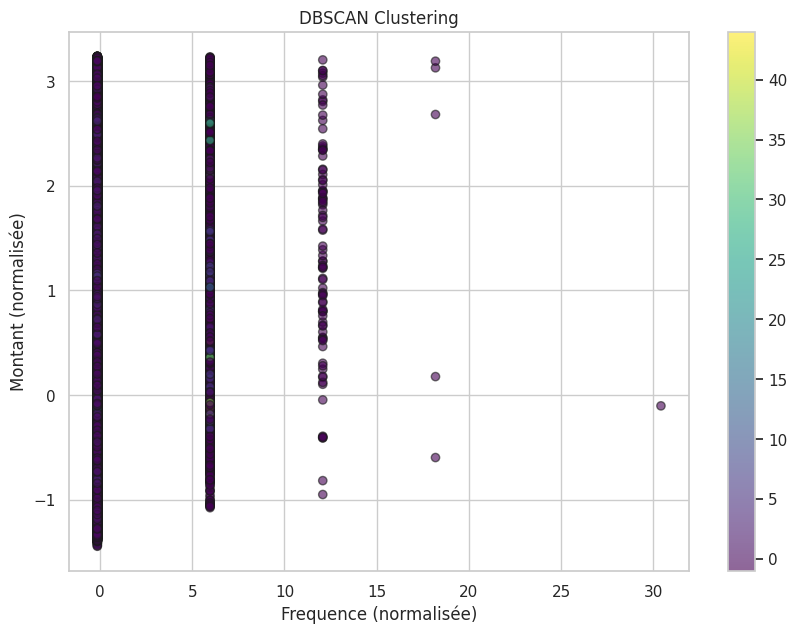

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

# Préparation et normalisation des données
scaler = StandardScaler()
features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
features_scaled = scaler.fit_transform(features)

# Réalisation du clustering DBSCAN
dbscan = DBSCAN(eps=0.15, min_samples=8)
clusters = dbscan.fit_predict(features_scaled)

# Affichage des labels des clusters
unique_clusters = np.unique(clusters)
print("Labels des clusters:", unique_clusters)

# Calcul du score de silhouette, en excluant les points considérés comme du bruit
if (
    len(unique_clusters) > 1
):  # Silhouette score needs at least 2 clusters to be computed
    silhouette_avg = silhouette_score(features_scaled, clusters)
    print("Le score de silhouette pour DBSCAN est :", silhouette_avg)
else:
    print("Pas assez de clusters pour calculer le score de silhouette.")

# Visualisation des résultats
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    features_scaled[:, 0],
    features_scaled[:, 1],
    c=clusters,
    cmap="viridis",
    edgecolor="k",
    alpha=0.6,
)
plt.title("DBSCAN Clustering")
plt.xlabel("Frequence (normalisée)")
plt.ylabel("Montant (normalisée)")
plt.colorbar(scatter)
plt.show()

### silhouette score

In [108]:
from sklearn.metrics import silhouette_score

# Suppression des points de bruit
mask = clusters != -1
filtered_features = features_scaled[mask]
filtered_clusters = clusters[mask]

# Calcul du score de silhouette, seulement si des clusters valides existent
if (
    len(np.unique(filtered_clusters)) > 1
):  # Besoin d'au moins 2 clusters pour calculer le score
    silhouette_avg = silhouette_score(filtered_features, filtered_clusters)
    print(
        "Le score de silhouette ajusté (sans les points de bruit) est :", silhouette_avg
    )
else:
    print(
        "Pas assez de clusters après exclusion des points de bruit pour calculer le score de silhouette."
    )

Le score de silhouette ajusté (sans les points de bruit) est : -0.02440478394358071


## Agglomerative Clustering

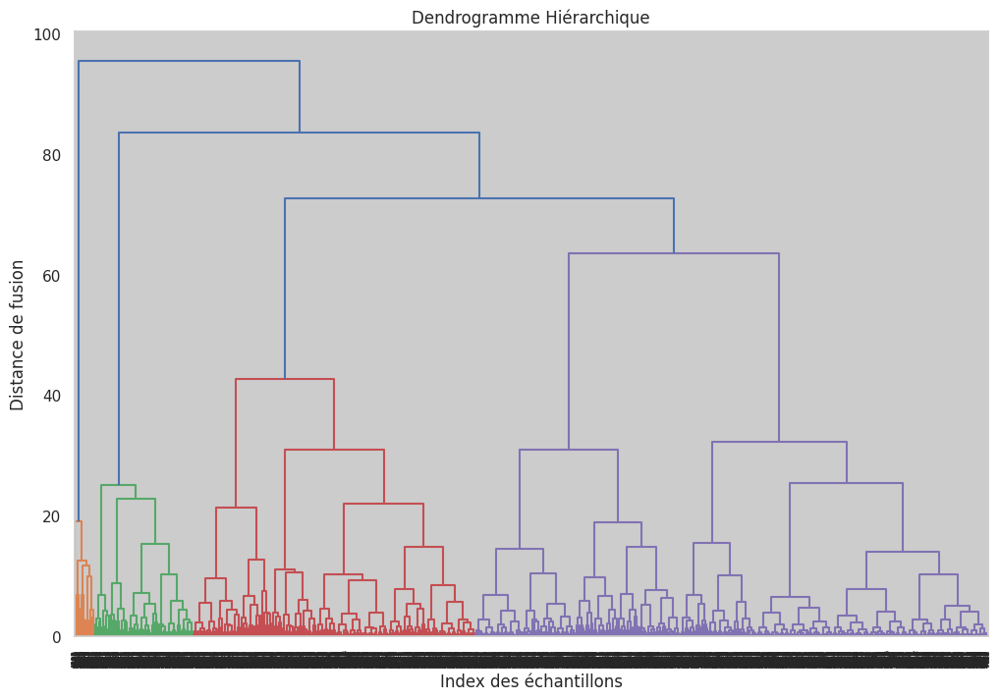

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage

# Préparation et normalisation des données
scaler = StandardScaler()
features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
features_scaled = scaler.fit_transform(features)

# Sous-échantillonnage des données pour réduire la charge de calcul
np.random.seed(42)  # pour la reproductibilité
indices = np.random.choice(
    features_scaled.shape[0], 5000, replace=False
)  # ajuster la taille de l'échantillon si nécessaire
sampled_features_scaled = features_scaled[indices]

# Réalisation du clustering agglomératif
agg_cluster = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0, linkage="ward"
)
agg_cluster.fit(sampled_features_scaled)

# Utilisation de la fonction linkage de scipy pour construire la matrice de liaison
Z = linkage(sampled_features_scaled, method="ward")

# Tracer le dendrogramme
plt.figure(figsize=(12, 8))
dendrogram(Z)
plt.title("Dendrogramme Hiérarchique")
plt.xlabel("Index des échantillons")
plt.ylabel("Distance de fusion")
plt.show()

In [110]:
customer_grouped

,customer_unique_id,frequence,montant,moyenne_review_score,recence,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,5.0,160.273507,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,4.0,163.263090,0
2,0000f46a3911fa3c0805444483337064,1,86.22,3.0,585.850868,3
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,4.0,369.875428,3
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,5.0,336.905972,1
...,...,...,...,...,...,...
85363,fffbf87b7a1a6fa8b03f081c5f51a201,1,167.32,5.0,293.787234,1
85364,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,4.0,310.890532,0
85365,ffff371b4d645b6ecea244b27531430a,1,112.46,5.0,617.070162,3
85366,ffff5962728ec6157033ef9805bacc48,1,133.69,5.0,168.092095,0


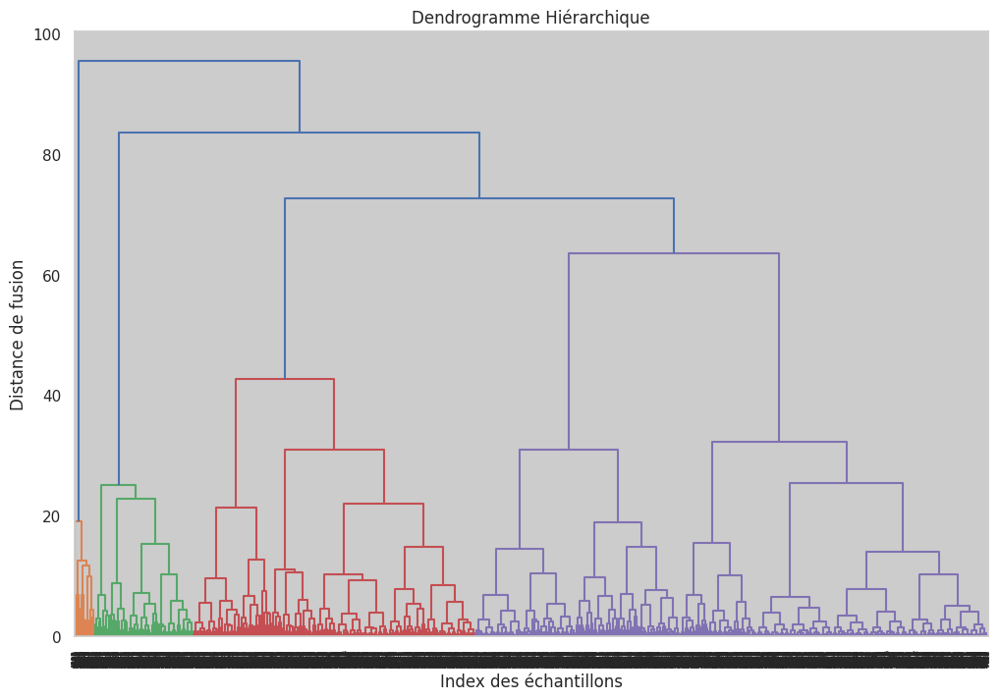

Labels des clusters: [0 1 0 ... 0 0 0]


In [111]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage

# Préparation et normalisation des données
scaler = StandardScaler()
features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
features_scaled = scaler.fit_transform(features)

# Sous-échantillonnage des données pour réduire la charge de calcul
np.random.seed(42)  # pour la reproductibilité
indices = np.random.choice(
    features_scaled.shape[0], 5000, replace=False
)  # ajuster la taille de l'échantillon si nécessaire
sampled_features_scaled = features_scaled[indices]

# Réalisation du clustering agglomératif avec 4 clusters
agg_cluster = AgglomerativeClustering(n_clusters=4, linkage="ward")
cluster_labels = agg_cluster.fit_predict(sampled_features_scaled)

# Utilisation de la fonction linkage de scipy pour construire la matrice de liaison
Z = linkage(sampled_features_scaled, method="ward")

# Tracer le dendrogramme
plt.figure(figsize=(12, 8))
dendrogram(Z)
plt.title("Dendrogramme Hiérarchique")
plt.xlabel("Index des échantillons")
plt.ylabel("Distance de fusion")
plt.show()

# Affichage des labels des clusters
print("Labels des clusters:", cluster_labels)

### visualisation

/home/alexandre/anaconda3/envs/stabadenvP5/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/home/alexandre/anaconda3/envs/stabadenvP5/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/home/alexandre/anaconda3/envs/stabadenvP5/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.


/home/alexandre/anaconda3/envs/stabadenvP5/lib/python3.12/site-packages/seaborn/axisgrid.py:1513: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; ple

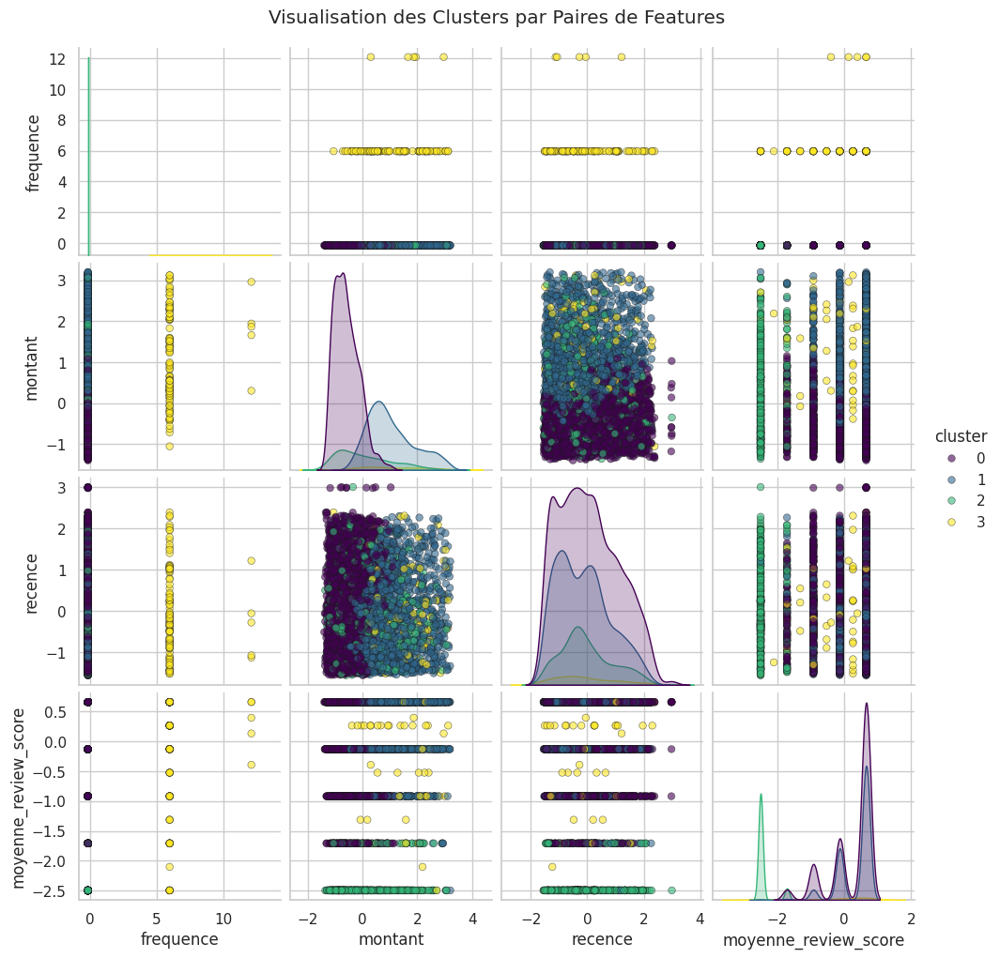

In [112]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt


# Mise à l'échelle des données
scaler = StandardScaler()
features = customer_grouped[["frequence", "montant", "recence", "moyenne_review_score"]]
features_scaled = scaler.fit_transform(features)

# Sous-échantillonnage des données
np.random.seed(42)
indices = np.random.choice(features_scaled.shape[0], 5000, replace=False)
sampled_features_scaled = features_scaled[indices]

# Clustering agglomératif
agg_cluster = AgglomerativeClustering(n_clusters=4, linkage="ward")
cluster_labels = agg_cluster.fit_predict(
    sampled_features_scaled
)  # Créez les labels directement ici

# Création du DataFrame pour Seaborn
sampled_data = pd.DataFrame(
    sampled_features_scaled,
    columns=["frequence", "montant", "recence", "moyenne_review_score"],
)
sampled_data["cluster"] = cluster_labels  # Ajout des labels de cluster directement

# Pairplot avec Seaborn
sns.set(style="whitegrid")
pairplot = sns.pairplot(
    sampled_data,
    hue="cluster",
    palette="viridis",
    plot_kws={"alpha": 0.6, "s": 30, "edgecolor": "k"},
    diag_kind="kde",
    diag_kws={"shade": True},
)
pairplot.fig.suptitle("Visualisation des Clusters par Paires de Features", y=1.02)
plt.show()

### silhouette score

In [113]:
# Agglomerative Clustering sur les données échantillonnées
agg_cluster = AgglomerativeClustering(n_clusters=4, linkage="ward")
cluster_labels = agg_cluster.fit_predict(
    sampled_features_scaled
)  # Créez les labels directement ici

# Calcul du score de silhouette
silhouette_avg = silhouette_score(sampled_features_scaled, cluster_labels)
print("Le score de silhouette moyen est :", silhouette_avg)

Le score de silhouette moyen est : 0.2711228514034646


In [114]:
customer_grouped

,customer_unique_id,frequence,montant,moyenne_review_score,recence,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,5.0,160.273507,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,4.0,163.263090,0
2,0000f46a3911fa3c0805444483337064,1,86.22,3.0,585.850868,3
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,4.0,369.875428,3
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,5.0,336.905972,1
...,...,...,...,...,...,...
85363,fffbf87b7a1a6fa8b03f081c5f51a201,1,167.32,5.0,293.787234,1
85364,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,4.0,310.890532,0
85365,ffff371b4d645b6ecea244b27531430a,1,112.46,5.0,617.070162,3
85366,ffff5962728ec6157033ef9805bacc48,1,133.69,5.0,168.092095,0


In [115]:
# Supprimer la colonne 'Cluster'
customer_grouped_export = customer_grouped.drop(columns=["Cluster"])

# Exporter en fichier CSV
customer_grouped_export.to_csv(
    "customer.csv", index=False
)  # index=False pour ne pas inclure l'index du DataFrame dans le fichier